In [1]:
# Basic libraries
import re
import os
import gc
import warnings
import numpy as np
import pandas as pd

from wordcloud import WordCloud
import matplotlib.pyplot as plt

from gensim import corpora

warnings.filterwarnings("ignore")
import time

import sys
sys.path.append("..")
from measure_time import measure_time
%matplotlib inline

In [2]:
os.getcwd()

'D:\\Исследования и наука\\Вузы привлечение абитуриентов\\pyUNI_project'

In [3]:
# I am not sure if we need this to run bc I don't remember if it's used anywhere further
# Delete the cell?

# Import the class
from corpus_maker import CorpusMaker

Loading BokehJS ...

In [ ]:
# I am not sure if we need this to run bc I don't remember fi it's used anywhere further
# Delete the cell?

# Initialize the CorpusMaker class
corp_maker = CorpusMaker(input_folder = '../LDA_MSc_2_Preprocessing/Filtered Theses',
                         info_file = '../LDA_MSc_1_Webscraping/thesis_info.pkl')

In [3]:
groups_files = os.listdir('Preprocessed')

# Initialize empty list
groups_words = []

prepr_groups_files = os.listdir('Preprocessed')

for group in prepr_groups_files:
    group_df = pd.read_csv(f'Preprocessed/{group}', index_col = "Unnamed: 0")
    group_words = " ".join(list(group_df['text_tokens'].dropna()))
    groups_words.append(group_words)

In [4]:
len(groups_words)

15

In [5]:
# Flatten into a list including all tokens
tokens_overall = [token for group_list in groups_words for token in group_list.split()]
len(tokens_overall)

2304446

In [6]:
tokens_overall[0]

'каждый'

In [7]:
# Get the token distribution and drop out words mentioned less than three times
tokens_distribution = pd.Series(tokens_overall).value_counts()
tokens_distribution_wo_rare_words = tokens_distribution[tokens_distribution > 2]

groups_words_wo_rare_words = [[token for token in group_list.split() if token in tokens_distribution_wo_rare_words]
                              for group_list in groups_words]

print(f'\nAfter removing {sum(tokens_distribution) - sum(tokens_distribution_wo_rare_words)} rare words, \
total amount of words in the preprocessed texts decreased from {sum(tokens_distribution)} to {sum(tokens_distribution_wo_rare_words)}')  


After removing 37170 rare words, total amount of words in the preprocessed texts decreased from 2304446 to 2267276


In [8]:
dictionary = corpora.Dictionary(groups_words_wo_rare_words)
dictionary_token2id = dictionary.token2id

corpus = [dictionary.doc2bow(group_list) for group_list in groups_words_wo_rare_words]

In [9]:
#prints most frequent words per group in corpus
for i, group_file in enumerate(corpus):
    print(f"\nGroup {i+1}")
    sorted_group_file = sorted(group_file, key=lambda x: x[1], reverse=True)
    for id, freq in sorted_group_file[:5]:
        print(f"\n{dictionary[id]}: {freq}")
    print() 


Group 1

спбгута: 4829

студент: 3665

год: 3174

университет: 2568

санкт: 2139


Group 2

анон: 787

мочь: 716

весь: 513

привет: 479

курс: 422


Group 3

спбгута: 1489

абитуриент: 1278

бонч: 1223

университет: 790

поступать: 777


Group 4

вшэ: 3794

вышка: 2962

ниу: 2508

год: 1787

студент: 1652


Group 5

привет: 7100

анон: 5925

весь: 5704

мочь: 4135

вопрос: 3637


Group 6

вшэ: 1043

программа: 1025

вышка: 736

ниу: 672

год: 617


Group 7

итмый: 2620

университет: 1509

новый: 904

год: 801

проект: 643


Group 8

анон: 4120

привет: 2267

весь: 2260

мочь: 2199

курс: 1543


Group 9

итмый: 982

абитуриент: 502

университет: 483

день: 425

программа: 319


Group 10

лэти: 5537

год: 2546

студент: 2413

спбгэта: 2225

который: 1654


Group 11

анон: 3390

мочь: 1597

весь: 1456

курс: 1412

привет: 1266


Group 12

лэти: 929

факультет: 481

вопрос: 450

абитуриент: 384

день: 363


Group 13

политех: 2564

политехпетра: 2235

год: 1691

студент: 1431

наш: 1367


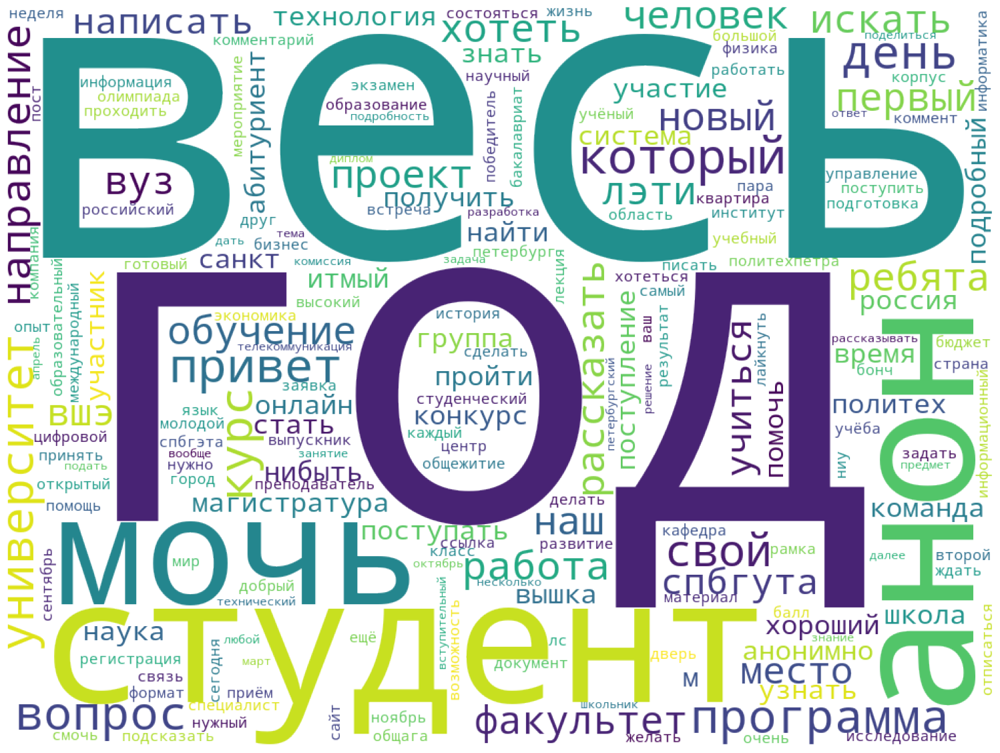

In [10]:
word_freq = {}
# Calculate word frequencies for theses in corpus and dictionary
for group in corpus:
    for id, frequency in group:
        word = dictionary[id]

        if word in word_freq:
            word_freq[word] += frequency
        else:
            word_freq[word] = frequency

wordcloud = WordCloud(width = 960, height = 720, background_color ="rgba(255, 255, 255, 0)", mode="RGBA", random_state = 66).generate_from_frequencies(word_freq)

plt.figure(figsize=(19.2, 14.4))
plt.imshow(wordcloud)
plt.axis('off')
#plt.savefig('MSc_Wordcloud.png', transparent = True, dpi = 300)
plt.show()
plt.close()

In [11]:
docs = [" ".join(group_tokens) for group_tokens in groups_words_wo_rare_words]

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(docs)

Loading BokehJS ...

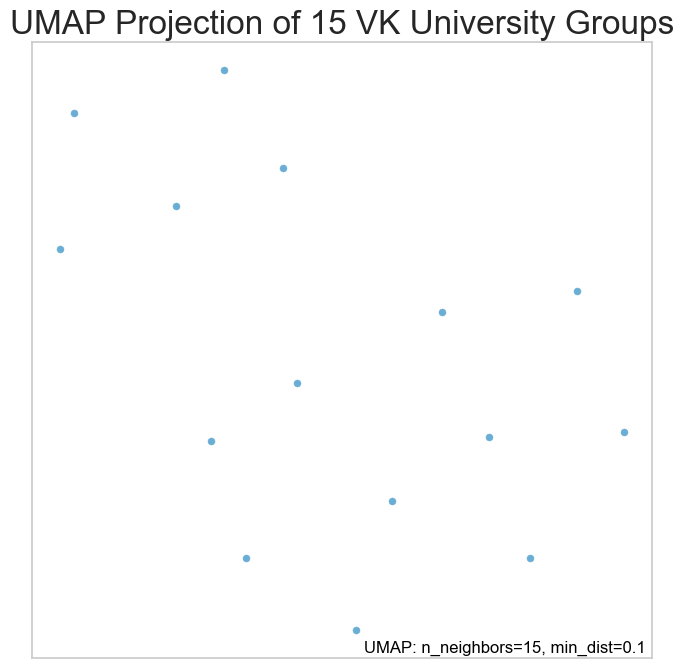

In [13]:
from yellowbrick.text import UMAPVisualizer
from umap.umap_ import UMAP
import umap.plot
#%matplotlib notebook
from bokeh.plotting import show, save, output_notebook, output_file, reset_output
from bokeh.resources import INLINE
output_notebook(resources=INLINE)

# Apply UMAP and plot results
mapper = UMAP(random_state=66).fit(tfidf_matrix)

f = umap.plot.points(mapper)
f.set_title('UMAP Projection of {} VK University Groups'.format(len(docs)), fontsize = 24)
#plt.savefig('UMAP theses.png', transparent = True, dpi = 300)
plt.show()
plt.close()

#fig2 = umap.plot.interactive(mapper, hover_data = thesis_info_pd[['Title', 'Author']], point_size=5)
#show(fig2)
#output_file("UMAP theses interactive.html")  # Set the output file path
#save(fig2)

In [14]:
import gensim
from gensim.models import CoherenceModel, LdaSeqModel 

# Set up LDA model
model = gensim.models.LdaModel(corpus = corpus,
                                   id2word = dictionary,
                                   num_topics = 12,
                                   random_state = 66,  # Custom random state used in our project
                                   update_every = 1,
                                   chunksize = 100,
                                   passes = 10,
                                   alpha = 0.5, 
                                   per_word_topics = True,
                                   eta = 0.5) 

In [15]:
 # Get coherence score
coh_model = CoherenceModel(model = model, texts = groups_words_wo_rare_words, corpus = corpus,
                           dictionary = dictionary, coherence = 'c_v')
coherence = coh_model.get_coherence()
        
# Get perplexity
perplexity = model.log_perplexity(corpus)
        
print(f'\nCoherence Score is: {coherence}')
print(f'\nPerplexity Score is: {perplexity}')
print('\nSee the topics:')
topics = model.print_topics()
for topic in topics:
    print(topic)


Coherence Score is: 0.3537583110245215

Perplexity Score is: -7.653543186715756

See the topics:
(0, '0.002*"год" + 0.001*"весь" + 0.001*"студент" + 0.001*"день" + 0.001*"свой" + 0.001*"курс" + 0.001*"который" + 0.001*"программа" + 0.001*"университет" + 0.001*"мочь"')
(1, '0.001*"год" + 0.001*"университет" + 0.001*"весь" + 0.001*"студент" + 0.001*"вопрос" + 0.001*"который" + 0.001*"свой" + 0.001*"мочь" + 0.001*"день" + 0.001*"привет"')
(2, '0.001*"вшэ" + 0.001*"год" + 0.001*"студент" + 0.001*"который" + 0.001*"вышка" + 0.001*"программа" + 0.001*"весь" + 0.001*"свой" + 0.001*"вопрос" + 0.001*"мочь"')
(3, '0.016*"спбгута" + 0.010*"студент" + 0.010*"год" + 0.008*"университет" + 0.007*"санкт" + 0.006*"бонч" + 0.006*"день" + 0.005*"работа" + 0.005*"программа" + 0.005*"участие"')
(4, '0.002*"год" + 0.001*"весь" + 0.001*"студент" + 0.001*"который" + 0.001*"мочь" + 0.001*"программа" + 0.001*"курс" + 0.001*"анон" + 0.001*"свой" + 0.001*"день"')
(5, '0.019*"анон" + 0.015*"привет" + 0.014*"весь"

In [26]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# Visualize using pyLDAvis
pyLDAvis.enable_notebook()
viz = gensimvis.prepare(model, corpus, dictionary)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.094701 -0.178852       1        1  35.462618
3     -0.149703  0.075660       2        1  18.086630
7     -0.104341  0.029087       3        1  13.069911
9     -0.140055  0.030075       4        1  11.536797
11    -0.154652 -0.012795       5        1  11.071504
10    -0.102099  0.039475       6        1  10.770343
8      0.103479 -0.048236       7        1   0.000375
6      0.104510  0.007705       8        1   0.000370
0      0.125291  0.013572       9        1   0.000365
4      0.128935  0.006988      10        1   0.000364
2      0.138886  0.021284      11        1   0.000362
1      0.144451  0.016037      12        1   0.000361, topic_info=             Term          Freq         Total Category  logprob  loglift
11957        анон  15218.000000  15218.000000  Default  30.0000  30.0000
7714       привет  12136.000000  12136.000000  Default  29.0000  29.0000
1009         весь  16533.000000  16533.000000  Default  28.0000  28.0000
5199         мочь  13826.000000  13826.000000  Default  27.0000  27.0000
1867          год  16511.000000  16511.000000  Default  26.0000  26.0000
...           ...           ...           ...      ...      ...      ...
3938      команда      0.003200   4664.128027  Topic12  -7.8477  -1.6613
10333  технология      0.003406   5614.995452  Topic12  -7.7852  -1.7843
10958   факультет      0.003599   6844.615617  Topic12  -7.7300  -1.9272
11424     человек      0.003454   7330.877989  Topic12  -7.7711  -2.0369
8500   рассказать      0.003423   7593.743338  Topic12  -7.7801  -2.0811

[940 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
4          1  0.106653  абитуриент
4          2  0.254646  абитуриент
4          3  0.026239  абитуриент
4          4  0.124019  абитуриент
4          5  0.450963  абитуриент
...      ...       ...         ...
16506      1  0.011250    ясинский
16506      2  0.011250    ясинский
16506      3  0.011250    ясинский
16506      4  0.967457    ясинский
16506      5  0.011250    ясинский

[2888 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 8, 10, 12, 11, 9, 7, 1, 5, 3, 2])

In [16]:
def get_coherence_score(n, alpha, beta):
        
    '''
    Calculates the coherence score per model using gensim's CoherenceModel.
        
    Args:
        n: Number of topics in one LDA model (per iteration of search)
        alpha: Document-Topic Density
        beta: Topic-Word Density
            
    Returns:
        Coherence score, fitted LDA model.
        
    '''
        
    m = gensim.models.LdaModel(corpus = corpus,
                                id2word = dictionary,
                                num_topics = n,
                                random_state = 66,  # Custom random state used in our project
                                update_every = 1,
                                chunksize = 100,
                                passes = 10,
                                alpha = alpha, # Alpha grabbed from function arguments
                                per_word_topics = True,
                                eta = beta) # beta grabbed from function arguments
        
    cm = CoherenceModel(model = m,
                        texts = groups_words_wo_rare_words,
                        corpus = corpus,
                        dictionary = dictionary,
                        coherence = 'c_v')
        
    # Returns the variables defined above
    # This comes in handy when fitting the best model after grid search
    return cm.get_coherence(), m

In [17]:
def grid_search(n_topics, alphas, betas, verbose = False):
        
    '''
    Performs grid search, finding optimal LDA parameters
        
    Args:
        n_topics: list of possible topic number (can use list(range( ,)))
        alphas: list of alpha values (can use np.arange( , , ).tolist())
        betas: list of beta values (can use np.arange( , , ).tolist())
        verbose: If set to true, will give information about the number of topics, alpha and beta values and their coherence score per iteration

    Returns:
        self.scores: Coherence and perplexity scores for all LDA models tried out in grid search. 
    '''

    scores = []
    # Begin loop
    for n in n_topics:
        for alpha in alphas:
            for beta in betas:

                # Get coherence score and model
                coherence_score, model = get_coherence_score(n, alpha, beta)
                # Get perplexity score from model
                perplexity_score = model.log_perplexity(corpus)

                # Append into empty container for scores
                scores.append({'n_topics': n,
                                    'alpha': alpha,
                                    'beta': beta,
                                    'coherence_score': coherence_score,
                                    'perplexity_score': perplexity_score})

                # This gives a very long print output in case of large grid search
                # so it is only activated if verbose = True
                if verbose:
                    print(f'\nNumber of topics: {n}; alpha: {alpha}; beta: {beta}; Achieved coherence score: {coherence_score}')

    return pd.DataFrame(scores)

In [18]:
# Set up parameter grid 
n_topics = range(2,13)
alpha = ['symmetric']
beta = ['auto']

# Set begin time
st = time.time()

# Do the grid search
scores_df = grid_search(n_topics, alpha, beta, verbose = True)

# Setting verbose = True ensures the function output in detail 

# Measure execution time
measure_time(st)


Number of topics: 2; alpha: symmetric; beta: auto; Achieved coherence score: 0.4483178225133204

Number of topics: 3; alpha: symmetric; beta: auto; Achieved coherence score: 0.48388088303144255

Number of topics: 4; alpha: symmetric; beta: auto; Achieved coherence score: 0.4626743973478224

Number of topics: 5; alpha: symmetric; beta: auto; Achieved coherence score: 0.4933230331276926

Number of topics: 6; alpha: symmetric; beta: auto; Achieved coherence score: 0.41893687840543214

Number of topics: 7; alpha: symmetric; beta: auto; Achieved coherence score: 0.4217050771598419

Number of topics: 8; alpha: symmetric; beta: auto; Achieved coherence score: 0.3807161728477816

Number of topics: 9; alpha: symmetric; beta: auto; Achieved coherence score: 0.4015027351165401

Number of topics: 10; alpha: symmetric; beta: auto; Achieved coherence score: 0.3866210315753263

Number of topics: 11; alpha: symmetric; beta: auto; Achieved coherence score: 0.4080223725609072

Number of topics: 12; alp

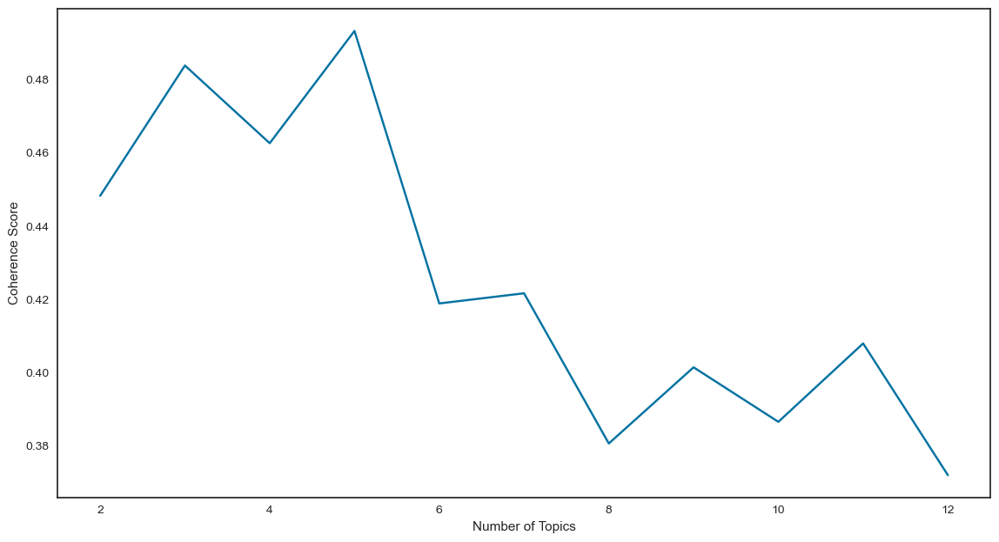

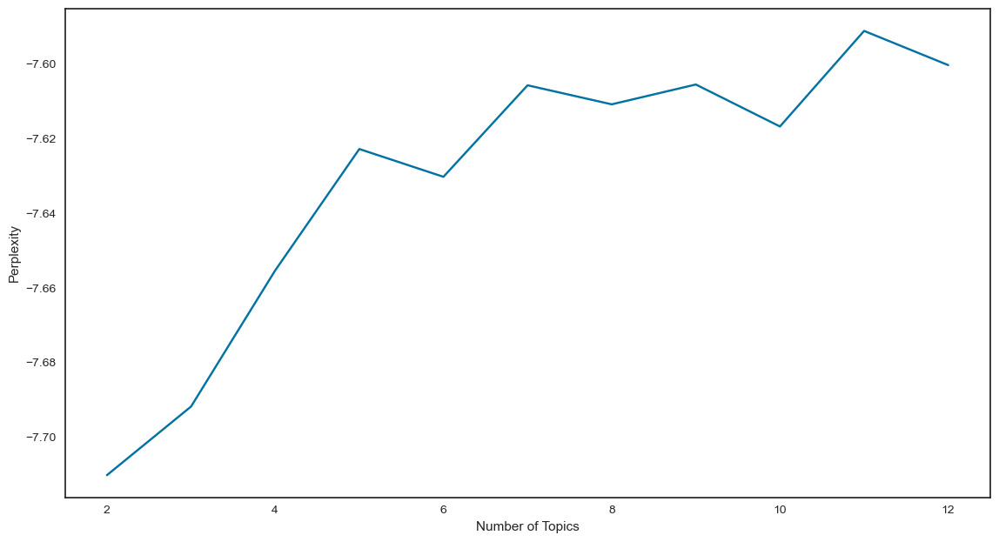

In [19]:
# Plot configuration 
plt.style.use('seaborn-v0_8-white')
plt.rcParams['figure.figsize'] = [12, 6.75]
plt.rcParams['font.size'] = 24

# Use list comprehension to extract the variables we need for plotting 
topics = scores_df['n_topics']#[n_topic['n_topics'] for n_topic in scores_df]
coherence_scores = scores_df['coherence_score']
perplexity_scores = scores_df['perplexity_score']
            
# Initialize subplots
fig1, ax1 = plt.subplots()
            
ax1.set_xlabel('Number of Topics')
ax1.set_ylabel('Coherence Score')
ax1.plot(topics, coherence_scores)
fig1.tight_layout()
#plt.savefig('1_Coherence_Scores.png', dpi = 300, transparent = True)
plt.show()
plt.close()
            
fig2, ax2 = plt.subplots()       
ax2.set_xlabel('Number of Topics')
ax2.set_ylabel('Perplexity')
ax2.plot(topics, perplexity_scores)
            
fig2.tight_layout()
#plt.savefig('2_Perplexity_Scores.png', dpi = 300, transparent = True)        
plt.show()
plt.close()

In [20]:
scores_df

,n_topics,alpha,beta,coherence_score,perplexity_score
0,2,symmetric,auto,0.448318,-7.710113
1,3,symmetric,auto,0.483881,-7.691725
2,4,symmetric,auto,0.462674,-7.655260
3,5,symmetric,auto,0.493323,-7.622732
4,6,symmetric,auto,0.418937,-7.630176
5,7,symmetric,auto,0.421705,-7.605660
6,8,symmetric,auto,0.380716,-7.610758
7,9,symmetric,auto,0.401503,-7.605448
8,10,symmetric,auto,0.386621,-7.616690
9,11,symmetric,auto,0.408022,-7.591090


In [21]:
# Set up the second stage parameter grid 

n_topics = [5]
alphas = np.arange(0.1, 1, 0.2).tolist()
betas = np.arange(0.1, 1, 0.2).tolist()

# Append symmetric and automatic alpha and beta values to the grid manually.
alphas.append('symmetric')
betas.append('auto')

# Set begin time
st = time.time()

# Do the grid search
scores_df2 = grid_search(n_topics, alphas, betas, verbose = True)

# Setting verbose = True ensures the function output in detail 

# Measure execution time
measure_time(st)


Number of topics: 5; alpha: 0.1; beta: 0.1; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.1; beta: 0.30000000000000004; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.1; beta: 0.5000000000000001; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.1; beta: 0.7000000000000001; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.1; beta: 0.9000000000000001; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.1; beta: auto; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.30000000000000004; beta: 0.1; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.30000000000000004; beta: 0.30000000000000004; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.30000000000000004; beta: 0.5000000000000001; Achieved coherence score: 0.4933230331276926

Number of topics: 5; alpha: 0.30000000000000004;

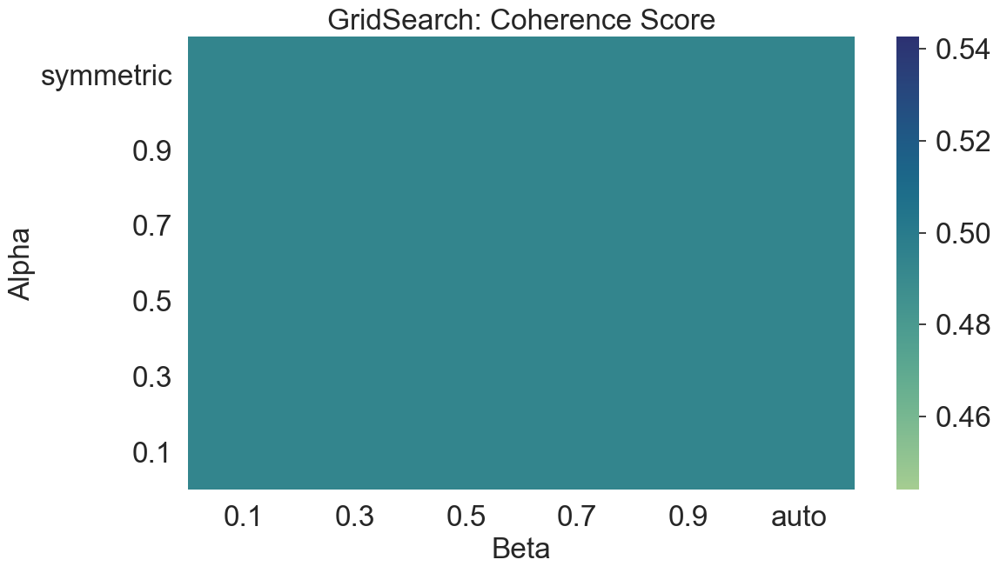

In [22]:
import seaborn as sns

#df = pd.read_csv('Topics_CSVs/scores_from_search.csv')
df = scores_df2.drop(['n_topics', 'perplexity_score'], axis = 1)
        
pivot_table = pd.pivot_table(df, index='alpha', columns='beta', values='coherence_score')
pivot_table.columns = [round(col, 1) if type(col)==float else col for col in pivot_table.columns]
pivot_table.index = [round(idx, 1) if type(idx)==float else idx for idx in pivot_table.index]
pivot_table = pivot_table.iloc[::-1]
        
# Set the figure size and font size
sns.set(rc={'figure.figsize': (12, 6.75)})
sns.set(font_scale=1.5)
# Set the seaborn style
sns.set(style="white")
        
fig, ax = plt.subplots()
sns.heatmap(pivot_table, ax=ax, cmap="crest")

ax.set_title('GridSearch: Coherence Score', fontdict={'fontsize': 24})
ax.set_xlabel('Beta', fontdict={'fontsize': 24})
ax.set_ylabel('Alpha', fontdict={'fontsize': 24})
ax.tick_params(axis='x', labelsize=24)  # Format x-axis tick labels
ax.tick_params(axis='y', labelsize=24, labelrotation=0)
cax = ax.figure.axes[-1]
cax.tick_params(labelsize=24) #format colorbar tick labels
        
plt.tight_layout()
plt.savefig('3_grid_search_2_heatmap.png', dpi=300, transparent=True)
plt.show()

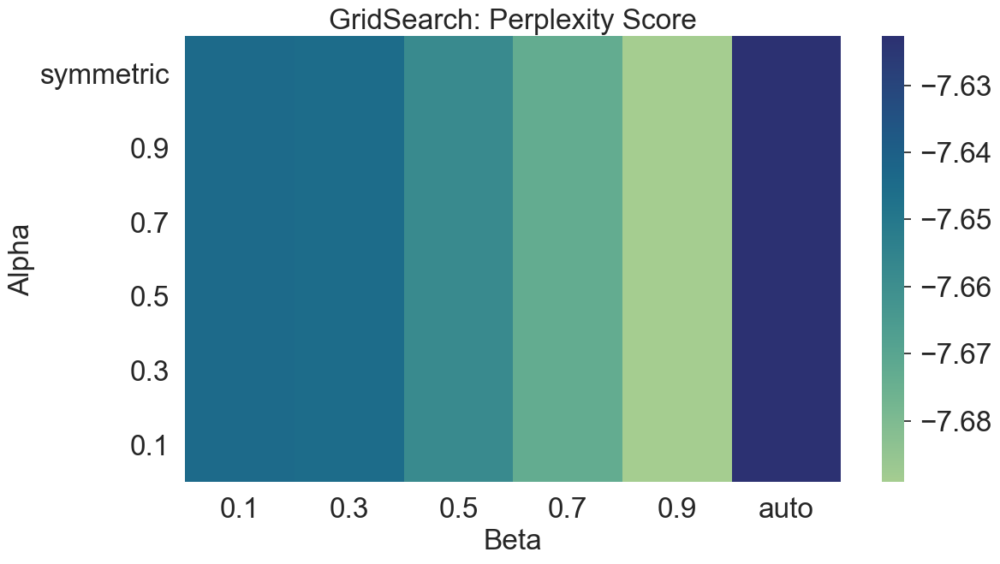

In [23]:
import seaborn as sns

#df = pd.read_csv('Topics_CSVs/scores_from_search.csv')
df = scores_df2.drop(['n_topics', 'coherence_score'], axis = 1)
        
pivot_table = pd.pivot_table(df, index='alpha', columns='beta', values='perplexity_score')
pivot_table.columns = [round(col, 1) if type(col)==float else col for col in pivot_table.columns]
pivot_table.index = [round(idx, 1) if type(idx)==float else idx for idx in pivot_table.index]
pivot_table = pivot_table.iloc[::-1]
        
# Set the figure size and font size
sns.set(rc={'figure.figsize': (12, 6.75)})
sns.set(font_scale=1.5)
# Set the seaborn style
sns.set(style="white")
        
fig, ax = plt.subplots()
sns.heatmap(pivot_table, ax=ax, cmap="crest")

ax.set_title('GridSearch: Perplexity Score', fontdict={'fontsize': 24})
ax.set_xlabel('Beta', fontdict={'fontsize': 24})
ax.set_ylabel('Alpha', fontdict={'fontsize': 24})
ax.tick_params(axis='x', labelsize=24)  # Format x-axis tick labels
ax.tick_params(axis='y', labelsize=24, labelrotation=0)
cax = ax.figure.axes[-1]
cax.tick_params(labelsize=24) #format colorbar tick labels
        
plt.tight_layout()
plt.savefig('3_grid_search_2_heatmap_perplexity.png', dpi=300, transparent=True)
plt.show()

In [33]:
# Set up best LDA model
best_model = gensim.models.LdaModel(corpus = corpus,
                                   id2word = dictionary,
                                   num_topics = 5,
                                   random_state = 66,  # Custom random state used in our project
                                   update_every = 1,
                                   chunksize = 100,
                                   passes = 10,
                                   alpha = 0.5, 
                                   per_word_topics = True,
                                   eta = 0.9) 

print('\nSee the topics:')
best_topics = best_model.print_topics()
for topic in best_topics:
    print(topic)


See the topics:
(0, '0.010*"абитуриент" + 0.008*"день" + 0.008*"университет" + 0.008*"год" + 0.007*"поступление" + 0.007*"направление" + 0.006*"программа" + 0.006*"политех" + 0.006*"вопрос" + 0.006*"открытый"')
(1, '0.018*"привет" + 0.015*"анон" + 0.015*"весь" + 0.011*"мочь" + 0.010*"вопрос" + 0.009*"искать" + 0.008*"хотеть" + 0.008*"курс" + 0.008*"ребята" + 0.008*"написать"')
(2, '0.015*"вшэ" + 0.011*"вышка" + 0.010*"ниу" + 0.008*"программа" + 0.008*"год" + 0.008*"студент" + 0.007*"университет" + 0.007*"свой" + 0.006*"школа" + 0.006*"новый"')
(3, '0.009*"студент" + 0.009*"год" + 0.007*"лэти" + 0.006*"университет" + 0.006*"спбгута" + 0.006*"который" + 0.005*"день" + 0.005*"проект" + 0.005*"наш" + 0.005*"свой"')
(4, '0.020*"анон" + 0.012*"мочь" + 0.011*"весь" + 0.010*"привет" + 0.009*"курс" + 0.007*"вопрос" + 0.007*"ребята" + 0.006*"найти" + 0.006*"нибыть" + 0.006*"хотеть"')


In [34]:
# Visualize the best model using pyLDAvis
pyLDAvis.enable_notebook()
viz = gensimvis.prepare(best_model, corpus, dictionary)
viz

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.097724  0.026526       1        1  35.098414
4      0.118014  0.032946       2        1  20.250853
1      0.112069 -0.035337       3        1  16.432942
0     -0.057435  0.048935       4        1  14.179459
2     -0.074925 -0.073071       5        1  14.038331, topic_info=            Term          Freq         Total Category  logprob  loglift
11957       анон  14840.000000  14840.000000  Default  30.0000  30.0000
7714      привет  11745.000000  11745.000000  Default  29.0000  29.0000
1511         вшэ   6384.000000   6384.000000  Default  28.0000  28.0000
1665       вышка   5075.000000   5075.000000  Default  27.0000  27.0000
5730         ниу   3303.000000   3303.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
8258      работа   1184.017403   7999.318811   Topic5  -5.5940   0.0529
10958  факультет   1125.401327   6626.523985   Topic5  -5.6448   0.1904
10911    участие   1078.211015   5777.384431   Topic5  -5.6877   0.2847
6666      первый   1066.830753   6878.876101   Topic5  -5.6983   0.0996
5199        мочь   1064.273686  13535.927617   Topic5  -5.7007  -0.5797

[438 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
4          1  0.155659  абитуриент
4          2  0.053061  абитуриент
4          3  0.070291  абитуриент
4          4  0.614805  абитуриент
4          5  0.106318  абитуриент
...      ...       ...         ...
16506      1  0.010965    ясинский
16506      2  0.010965    ясинский
16506      3  0.010965    ясинский
16506      4  0.010965    ясинский
16506      5  0.953935    ясинский

[1700 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 5, 2, 1, 3])

In [35]:
topics_names = [
    "Admission and Enrollment",
    "Overheard: Discussions and Questions", #подслушано
    "Information about HSE",
    "Information about Technical Universities",
    "Overheard HSE: Discussions and Questions"
]

In [36]:
theta, _ = best_model.inference(corpus)
theta = pd.DataFrame(theta)
theta

,0,1,2,3,4
0,4457.913574,0.735927,34.915619,314615.437500,0.730639
1,6.089365,4.178170,0.723675,2.099182,41802.707031
2,77407.531250,0.655983,0.796978,516.636353,0.662352
3,18.158096,0.778031,197205.859375,378.723816,0.741196
4,9.441257,355660.625000,97.223244,1.644324,1084.917969
5,14757.861328,1474.141846,44849.781250,0.961094,4.835332
6,6916.897461,80.063217,74099.062500,28234.140625,1336.911377
7,424.943665,11817.662109,29.617188,20.879696,170395.296875
8,32680.197266,82.934959,138.671570,1.002617,160.668579
9,59.811832,7.247256,281.032196,253256.093750,27.461813


In [37]:
groups_names = pd.read_excel("Groups info.xlsx")
groups_names["Group Name"] = groups_names["University"] + " " + groups_names["Group Type"]
groups_names

,File Number,University,Group Type,Group Name
0,1,СПбГУТ,Основная,СПбГУТ Основная
1,2,СПбГУТ,Подслушано,СПбГУТ Подслушано
2,3,СПбГУТ,Поступление,СПбГУТ Поступление
3,4,НИУ ВШЭ,Основная,НИУ ВШЭ Основная
4,5,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано
5,6,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление
6,7,ИТМО,Основная,ИТМО Основная
7,8,ИТМО,Подслушано,ИТМО Подслушано
8,9,ИТМО,Поступление,ИТМО Поступление
9,10,ЛЭТИ,Основная,ЛЭТИ Основная


In [38]:
dominant_topic_doc = theta.idxmax(axis=1) + 1

len_docs = len(dominant_topic_doc)

groups_names['Topic']  = dominant_topic_doc
groups_names

,File Number,University,Group Type,Group Name,Topic
0,1,СПбГУТ,Основная,СПбГУТ Основная,4
1,2,СПбГУТ,Подслушано,СПбГУТ Подслушано,5
2,3,СПбГУТ,Поступление,СПбГУТ Поступление,1
3,4,НИУ ВШЭ,Основная,НИУ ВШЭ Основная,3
4,5,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано,2
5,6,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление,3
6,7,ИТМО,Основная,ИТМО Основная,3
7,8,ИТМО,Подслушано,ИТМО Подслушано,5
8,9,ИТМО,Поступление,ИТМО Поступление,1
9,10,ЛЭТИ,Основная,ЛЭТИ Основная,4


In [39]:
topic_mapping = {i + 1: topic_title for i, topic_title in enumerate(topics_names)}

groups_names['Topic Title'] = groups_names['Topic'].map(topic_mapping)
groups_names['Topic Title numbered'] = groups_names.apply(lambda row: f"{row['Topic']:01d}: {row['Topic Title']}", axis=1)
groups_names

,File Number,University,Group Type,Group Name,Topic,Topic Title,Topic Title numbered
0,1,СПбГУТ,Основная,СПбГУТ Основная,4,Information about Technical Universities,4: Information about Technical Universities
1,2,СПбГУТ,Подслушано,СПбГУТ Подслушано,5,Overheard: Discussions and Questions 2,5: Overheard: Discussions and Questions 2
2,3,СПбГУТ,Поступление,СПбГУТ Поступление,1,Admission and Enrollment,1: Admission and Enrollment
3,4,НИУ ВШЭ,Основная,НИУ ВШЭ Основная,3,Information about HSE,3: Information about HSE
4,5,НИУ ВШЭ,Подслушано,НИУ ВШЭ Подслушано,2,Overheard: Discussions and Questions,2: Overheard: Discussions and Questions
5,6,НИУ ВШЭ,Поступление,НИУ ВШЭ Поступление,3,Information about HSE,3: Information about HSE
6,7,ИТМО,Основная,ИТМО Основная,3,Information about HSE,3: Information about HSE
7,8,ИТМО,Подслушано,ИТМО Подслушано,5,Overheard: Discussions and Questions 2,5: Overheard: Discussions and Questions 2
8,9,ИТМО,Поступление,ИТМО Поступление,1,Admission and Enrollment,1: Admission and Enrollment
9,10,ЛЭТИ,Основная,ЛЭТИ Основная,4,Information about Technical Universities,4: Information about Technical Universities


Text(0.5, 1.0, 'UMAP: 15 MSc Theses Colored by Topics')

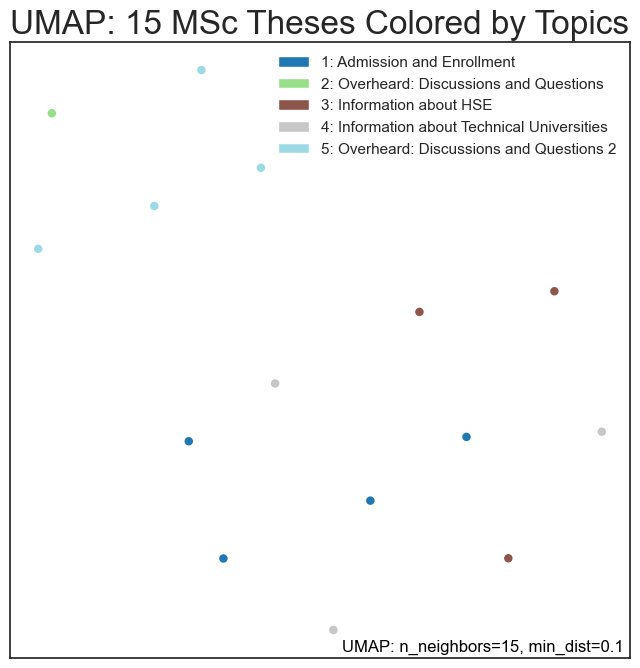

In [40]:
f = umap.plot.points(mapper, labels=groups_names['Topic Title numbered'], theme = 'blue')
f.set_title('UMAP: {} MSc Theses Colored by Topics'.format(len_docs), fontsize = 24)

In [41]:
fig2 = umap.plot.interactive(mapper, hover_data = groups_names[['University', 'Group Type', 'Topic', 'Topic Title']], 
                                     labels=groups_names['Topic Title numbered'],
                                     point_size=9,  theme='blue')
show(fig2)

C:\Users\baltt\anaconda3\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


C:\Users\baltt\anaconda3\lib\site-packages\bokeh\io\notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)
